# Table of contents<a id="TOC"></a>
1. [Load required libraries](#libraries)
2. [Load data from .json file](#json)
  1. [Adjust experiment naming and set order](#naming)
3. [Run data analysis](#analysis)
4. [Visualize output](#output)
  1. [Depth bar plot](#depth)
  2. [Coverage barplot](#coverage)
  3. [Venn diagram](#venn)
  4. [Intra-map scatter](#intra)
  5. [Inter-map scatter](#inter)
  6. [SVM performance](#svm)
  7. [Organelle profiles](#organelles)
  8. [PCA plot](#pca)
  9. [Correlation plots](#correlations)

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
# Load required libraries<a id="libraries"></a>

In [1]:
import pandas as pd
import re
import numpy as np
import domaps
import plotly.graph_objects as go
import plotly.express as px
import json
import panel as pn

pn.extension()
pn.extension("plotly")
import traceback

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
# Load data from .json file<a id="json"></a>

In [2]:
file = "../AnalysedDatasets_100 min_Figure2_SVM.json"
with open(file) as file_input:
    content = json.load(file_input)

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## Adjust experiment naming and set order<a id="naming"></a>

In [3]:
content.keys()

dict_keys(['100 min DDA', '100 min discovery DIA', '100 min library DIA'])

In [4]:
# Note: run this cell only once, or reload data from the file
content["DDA"] = content.pop("100 min DDA")
content["discovery DIA"] = content.pop("100 min discovery DIA")
content["library DIA"] = content.pop("100 min library DIA")

In [5]:
# This will be used throughout to set the order of the experiments
experiment_order = ["DDA", "discovery DIA", "library DIA"]

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
# Run data analysis<a id="analysis"></a>

In [6]:
# Initialize object
comp = domaps.SpatialDataSetComparison(ref_exp="DDA")

# Read and align data
comp.json_dict = {k: content[k] for k in experiment_order}
comp.read_jsonFile()

# Run processing steps
comp.calc_biological_precision()
comp.get_complex_coverage()
comp.perform_pca_comparison()
comp.calculate_global_scatter(
    metric="manhattan distance to average profile", consolidation="average"
)
try:
    comp.svm_processing()
except:
    print("Likely the data doesn't include misclassification matrices")
    print(traceback.format_exc())

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
# Visualize output<a id="output"></a>

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## Set default layout options<a id="depth"></a>

In [7]:
layout = dict(
    margin=dict(l=0, r=0, t=30, b=0),
    font_size=10,
    font_family="Arial",
    legend=dict(bgcolor=None),
    xaxis=dict(ticklen=4),
    yaxis=dict(ticklen=4),
)

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## Depth barplot<a id="depth"></a>

In [8]:
fig_depth = comp.quantity_pr_pg_barplot_comparison(experiment_order)[0]
fig_depth.update_layout(layout)
fig_depth.update_layout(
    margin=dict(t=0),
    title=None,
    showlegend=True,
    width=350,
    height=180,
)

In [9]:
# fig_depth.write_image("Figure2_Depth.svg")

## Coverage barplot<a id="coverage"></a>
[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)

In [10]:
fig_coverage = comp.coverage_comparison(experiment_order)
fig_coverage.update_layout(layout)
fig_coverage.update_layout(
    margin=dict(t=0),
    title=None,
    showlegend=True,
    width=280,
    height=170,
    yaxis=dict(title="profile completeness"),
)

In [11]:
# fig_coverage.write_image("SUP_Coverage.svg")

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## Venn diagram<a id="venn"></a>
The venn diagram is one of the few plots, that are not generated through plotly. For display in DOMQC the figure is converted to jpeg. Thus, if the vector graphic is required the diagram has to be regenerated.

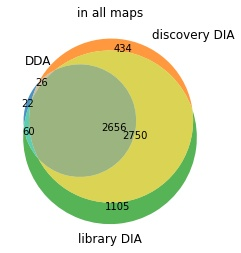

<Figure size 432x288 with 0 Axes>

In [12]:
# online version
fig_venn = comp.venn_sections(experiment_order, omit_size=50)[1]
fig_venn

In [13]:
# load required libraries
import matplotlib.pyplot as plt
import matplotlib_venn as venn

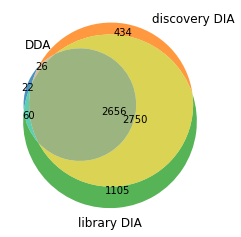

In [14]:
# recreate Venn diagram
vd, axes = plt.subplots(1, 1)
venn.venn3(
    [
        set(
            comp.df_01_filtered_combined.xs(i, level="Experiment", axis=0)
            .unstack(["Exp_Map", "Map"])
            .dropna()
            .index.get_level_values("Protein IDs")
        )
        for i in experiment_order
    ],
    set_labels=([i for i in experiment_order]),
    set_colors=px.colors.qualitative.D3[0:3],
    ax=axes,
    alpha=0.8,
)
plt.figsize = (200, 200)

In [15]:
# plt.savefig("Figure2_Venn.svg", transparent=True)

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## Intra-map scatter<a id="intra"></a>
This comparison crucially depends on the selection of complexes. The easiest option is to first identify all complexes that have a minimum number of proteins quantified in all experiments and run the analysis on those. From these only redundant complexes should be removed manually (Nup107-160 subcomplex < Nuclear pore complex, Respiratory chain complex I core < Respiratory chain complex I complete), only retaining one of them.

If a specific set of proteins is to be queried, that is not included in the dictionary of complexes, this dictionary can be modified. This option was not used in the paper.

Different modes for plotting are available and specific complexes can be highlighted using the 'highlight' parameter.

In [16]:
# ceck complex coverage, result is returned and stored in coverage_lists.
comp.get_complex_coverage(5)
comp.coverage_lists

[{'28S ribosomal subunit, mitochondrial': 19,
  '39S ribosomal subunit, mitochondrial': 22,
  '40S ribosomal subunit, cytoplasmic': 27,
  '60S ribosomal subunit, cytoplasmic': 39,
  'Arp2/3 protein complex': 7,
  'CCT complex': 8,
  'COP9 signalosome complex': 6,
  'Coatomer complex': 8,
  'Dynactin complex': 5,
  'EMC': 6,
  'F1F0 ATP synthase': 8,
  'MCM complex': 6,
  'Multisynthetase complex': 9,
  'Nuclear pore complex': 15,
  'Nup107-160 subcomplex': 7,
  'Prefoldin complex': 5,
  'Proteasome': 14,
  'Respiratory chain complex I complete': 17,
  'Respiratory chain complex I core': 6,
  'Sec6/8 exocyst complex': 8,
  'V-type proton ATPase V1': 5},
 {'AP1 adaptor complex': [2, 5, 3],
  'AP2 adaptor complex': [4, 5, 5],
  'AP3 adaptor complex': [4, 5, 4],
  'Anaphase-promoting complex': [2, 8, 9],
  'GPI transamidase complex': [4, 5, 5],
  'RNA exosome complex': [2, 10, 10],
  'RNase MRP complex': [2, 7, 7],
  'Replication factor C': [4, 5, 5],
  'THO complex': [2, 7, 7],
  'Wave Re

In [17]:
# Version 1: use full coverage blindly
clusters = list(comp.coverage_lists[0].keys())
# Version 2: copy from above and remove redundant clusters
clusters = [
    "28S ribosomal subunit, mitochondrial",
    "39S ribosomal subunit, mitochondrial",
    "40S ribosomal subunit, cytoplasmic",
    "60S ribosomal subunit, cytoplasmic",
    "Arp2/3 protein complex",
    "CCT complex",
    "Coatomer complex",
    "COP9 signalosome complex",
    "Dynactin complex",
    "EMC",
    "F1F0 ATP synthase",
    "MCM complex",
    "Multisynthetase complex",
    "Nup107-160 subcomplex",
    "Prefoldin complex",
    "Proteasome",
    "Respiratory chain complex I core",
    "Sec6/8 exocyst complex",
    "V-type proton ATPase V1",
]

In [18]:
# plot scatter, adjusting same parameters as in the tool
bp = comp.plot_intramap_scatter(
    multi_choice=experiment_order,
    clusters_for_ranking=clusters,
    plot_type="strip",
    normalization=np.median,
    min_size=5,
)
fig_intramap = bp[1]
print(bp[0])

               distance
Experiment             
DDA            1.173530
discovery DIA  0.926085
library DIA    0.977579


In [19]:
fig_intramap.update_layout(layout)
fig_intramap.update_layout(
    margin=dict(t=0),
    showlegend=False,
    width=250,
    height=200,
    xaxis=dict(title=None),
    yaxis=dict(title="normalized complex scatter", dtick=0.2),
)
fig_intramap.show()

In [20]:
# fig_intramap.write_image("Figure2_Intramap.svg")

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## Inter-map scatter<a id="inter"></a>
To calculate the profile reproducibility with a different distance metric or aggregtion across replicates, copy the correspoding line from the analysis cell above.

In [21]:
# create and show plots once (this includes the title and with it the overlap)
reproducibility = comp.plot_reproducibility_distribution(
    x_cut=0.2, show_full=False, q=0.7
)
reproducibility.show()
reproducibility_full = comp.plot_reproducibility_distribution(
    x_cut=0.2, show_full=True, q=0.7
)
reproducibility_full.show()

In [22]:
reproducibility.update_layout(layout)
reproducibility.update_layout(
    margin=dict(t=0),
    title=None,
    showlegend=False,
    width=330,
    height=200,
    xaxis=dict(title="mean Δ between replicate profiles"),
    yaxis=dict(title="% protein groups"),
)
reproducibility.show()

In [23]:
reproducibility_full.update_layout(layout)
reproducibility_full.update_layout(
    margin=dict(t=0),
    title=None,
    showlegend=False,
    width=300,
    height=300,
    xaxis=dict(title="mean Δ between replicate profiles"),
    yaxis=dict(title="% protein groups"),
).for_each_trace(lambda x: x.update(visible=False), selector=dict(name="DDA full"))
reproducibility_full.show()

In [24]:
# reproducibility.write_image("Figure2_Reprod_across_2656.svg")
# reproducibility.update_layout(showlegend=True)
# reproducibility.write_image("Figure2_Reprod_legend.svg")
# reproducibility_full.write_image("Figure2_Reprod_fulldistr.svg")
# reproducibility_full.update_layout(showlegend=True)
# reproducibility_full.write_image("Figure2_Reprod_fulldistrlegend.svg")

### Gain of high reproducibility groups
An analysis we did not include in the paper is how many groups were gained at a certain reproducibility.
This is gaugegd by the 70% quantile in DDA (0.0899, n=1934) and retrieving all groups with higher reproducibility than that.

In [25]:
comp.distances.loc[comp.distances["DDA"] <= 0.0899].shape[0]

1934

In [26]:
print(
    comp.distances.loc[comp.distances["discovery DIA"] <= 0.0899].shape[0] / 1934,
    comp.distances.loc[comp.distances["library DIA"] <= 0.0899].shape[0] / 1934,
    comp.distances.loc[comp.distances["DDA"] <= 0.0899].shape[0] / 1934,
)

1.966907962771458 2.219751809720786 1.0


[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## SVM performance<a id="svm"></a>

In [27]:
comp.df_clusterPerformance_global.sort_index(axis=1, inplace=True)

Fig_SVM = comp.plot_svm_detail(
    multi_choice=experiment_order, orientation="h", score="F1 score"
)

Fig_SVM.update_layout(layout)
Fig_SVM.update_layout(
    margin=dict(t=0),
    title=None,
    showlegend=False,
    width=350,
    height=250,
    xaxis=dict(title_standoff=4, ticklen=3, dtick=0.2, domain=[0, 0.8]),
    yaxis=dict(title_standoff=15, ticklen=3, autorange="reversed"),
)

# Add second variable as annotation
for el in comp.df_clusterPerformance_global.loc["Class size"].DDA.items():
    Fig_SVM.add_annotation(
        x=0.8,
        xref="paper",
        y=el[0],
        text="n = " + str(int(el[1])),
        showarrow=False,
        xanchor="left",
    )

Fig_SVM.show()

In [28]:
# Fig_SVM.write_image("Figure2_SMV_performance.svg")

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## Organelle profiles<a id="organelles"></a>

In [29]:
plotdata = pd.DataFrame()
for el in set(comp.df_01_filtered_combined.index.get_level_values("Compartment")):
    el_df = comp.df_01_filtered_combined.xs(
        el, level="Compartment", axis=0, drop_level=False
    )
    plotdata = plotdata.append(
        el_df.stack("Fraction")
        .groupby(["Compartment", "Map", "Experiment", "Fraction"])
        .apply(
            lambda x: pd.Series(
                {
                    "profile [% total signal]": np.nanmean(x),
                    "std": np.nanstd(x),
                    "sem": np.nanstd(x) / np.sqrt(sum(np.isfinite(x))),
                }
            )
        )
        .reset_index()
        .rename(columns={"level_4": "measure", 0: "value"})
        .set_index(["Compartment", "Map", "Experiment", "Fraction", "measure"])
        .unstack("measure")
        .droplevel(0, axis=1)
        .reset_index()
    )
plotdata.sort_values(
    ["Experiment", "Fraction", "Compartment"],
    key=domaps.natsort_list_keys,
    inplace=True,
)
plotdata = plotdata.loc[
    [not el for el in plotdata.Compartment.isin(["undefined", "ER_high_curvature"])],
]
plotdata

measure,Compartment,Map,Experiment,Fraction,profile [% total signal],sem,std
1,Actin binding proteins,Map1,DDA,1K,0.242335,0.010435,0.057155
19,Actin binding proteins,Map2,DDA,1K,0.202236,0.009275,0.050804
37,Actin binding proteins,Map3,DDA,1K,0.272876,0.011790,0.065643
1,ER,Map1,DDA,1K,0.085068,0.003092,0.033013
19,ER,Map2,DDA,1K,0.076721,0.002817,0.029810
...,...,...,...,...,...,...,...
35,Peroxisome,Map2,library DIA,80K,0.071586,0.013270,0.060812
53,Peroxisome,Map3,library DIA,80K,0.062546,0.009925,0.045480
17,Plasma membrane,Map1,library DIA,80K,0.065384,0.002900,0.032029
35,Plasma membrane,Map2,library DIA,80K,0.069454,0.003195,0.035289


In [30]:
fig_profiles = (
    px.line(
        plotdata,
        x="Fraction",
        y="profile [% total signal]",
        error_y="sem",
        color="Experiment",
        line_group="Map",
        template="simple_white",
        facet_col="Compartment",
        facet_col_wrap=6,
        facet_row_spacing=0.01,
        facet_col_spacing=0.01,
    )
    .update_layout(
        layout,
        width=670,
        height=300,
        margin=dict(t=0),
        legend_x=1,
        legend_xanchor="right",
        legend_y=0.08,
        grid_xgap=0,
        grid_ygap=0,
    )
    .for_each_annotation(
        lambda a: a.update(text=a.text.split("=")[-1], yshift=-20, font_size=8)
    )
    .for_each_trace(lambda t: t.update(line_width=1, error_y_thickness=1))
)
fig_profiles

In [31]:
# fig_profiles.write_image(f"SUP_organelle_profiles.svg")

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## PCA plot<a id="pca"></a>
This is not the PCA plot shown in the paper, as a separate json collection was used to ensure comparable positions between figures on different datasets.

There is also a pca plot function in the library, but it is more convoluted and the output is the pca plot interface. Therefore we used a more minimial version here.

In [32]:
def plot_pca(comp, multi_choice, facets=3, opacity=0.7, x_PCA="PC1", y_PCA="PC3"):
    df_global_pca_exp = comp.df_pca.loc[comp.df_pca["Experiment"].isin(multi_choice)]
    df_global_pca_exp.reset_index(inplace=True)

    compartment_color = comp.color_maps["Compartments"]
    compartments = list(compartment_color.keys())
    compartments.pop(compartments.index("undefined"))
    compartments.insert(0, "undefined")

    df_global_pca = df_global_pca_exp.assign(
        Compartment_lexicographic_sort=pd.Categorical(
            df_global_pca_exp["Compartment"],
            categories=[x for x in compartments],
            ordered=True,
        )
    )
    df_global_pca.sort_values(
        ["Compartment_lexicographic_sort", "Experiment"], inplace=True
    )

    fig_global_pca = px.scatter(
        data_frame=df_global_pca,
        x=x_PCA,
        y=y_PCA,
        color="Compartment",
        color_discrete_map=compartment_color,
        title="Protein subcellular localization by PCA",
        hover_data=["Protein IDs", "Gene names", "Compartment"],
        facet_col="Experiment",
        facet_col_wrap=facets,
        opacity=opacity,
        template="simple_white",
        render_mode="svg",
    )

    fig_global_pca.update_layout(
        autosize=False,
        width=400 * facets,
        height=400
        * (int(len(multi_choice) / facets) + (len(multi_choice) % facets > 0)),
    )
    return fig_global_pca

In [33]:
pca_plot = plot_pca(comp, experiment_order, opacity=1)
pca_plot

In [34]:
pca_plot.update_layout(
    margin=dict(t=20),
    title=None,
    width=680,
    height=250,
    xaxis=dict(ticklen=2, title_standoff=0, dtick=2),
    xaxis2=dict(ticklen=2, title_standoff=0, dtick=2),
    xaxis3=dict(ticklen=2, title_standoff=0, dtick=2),
    yaxis=dict(ticklen=2, title_standoff=1, dtick=2),
    legend=dict(xanchor="left", x=0, y=-0.2, orientation="h", title=None),
).update_traces(marker_size=3)
pca_plot.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

In [35]:
# pca_plot.write_image("Figure2_pca.svg")

[<div style="text-align: right; font-size: 8pt">back to top</div>](#TOC)
## Correlation plots<a id="correlations"></a>

In [36]:
df = (
    comp.df_01_filtered_combined.reset_index("Exp_Map", drop=True)
    .unstack(["Experiment", "Map"])
    .dropna(axis=1, how="all")
)
df.columns = ["_".join(el) for el in df.columns]
plot_corr = domaps.plot_sample_correlations(df, data_columns="(.*)", mode="heatmap")
plot_corr

In [37]:
plot_corr.update_layout(
    width=580,
    height=500,
    margin=dict(r=0, b=0, t=0, l=0),
    font_size=9,
    font_family="Arial",
)

In [38]:
# plot_corr.write_image("Figure3_SUP_Correlations.svg")